# Getting the Dataset

In [1]:
!pip install 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-vv1zcrmp
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-vv1zcrmp
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done
  Created wheel for pycocotools: filename=pycocotools-2.0-cp310-cp310-linux_x86_64.whl size=386255 sha256=bab970315d5acfc7d4e1c50f3972a879631d1b882b347557474ec0b0459f019c
  Stored in directory: /tmp/pip-ephem-wheel-cache-712tb0z6/wheels/39/61/b4/480fbddb4d3d6bc34083e7397bc6f5d1381f79acc68e9f3511
Successfully built pycocotools
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0.6
    Uninstalling pycocotools-2.0.6:
      Successfully uninstalled pycocotools-2.0.6


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!mkdir datasets
!cp /content/drive/MyDrive/images/* ./datasets/ -r

In [4]:
!mkdir datasets2
!cp /content/drive/MyDrive/dmg-ds-new/roboflow.zip ./

In [5]:
!unzip -q -o /content/roboflow.zip -d datasets2/

In [6]:
!mkdir /content/datasets2/img
!cp /content/datasets2/{test,train,valid}/*.jpg /content/datasets2/img/

# Checking the Dataset

In [ ]:
%matplotlib inline
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import pylab
import random
pylab.rcParams['figure.figsize'] = (8.0, 10.0)# Import Libraries

# For visualization
import os
from matplotlib import colors
from tensorboard.backend.event_processing import event_accumulator as ea
from PIL import Image

In [ ]:
val_data_path='/content/datasets/val'
val_annots='COCO_val_annos'
mul_val_annots='COCO_mul_val_annos'
annot_path=f'{val_data_path}/{val_annots}.json'
mul_annot_path=f'{val_data_path}/{mul_val_annots}.json'
img_dir = "/content/datasets/img"

In [ ]:
coco=COCO(annot_path)
mul_coco=COCO(mul_annot_path)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
# display categories and supercategories

# Damage dataset
cats = coco.loadCats(coco.getCatIds())
names=[cat['name'] for cat in cats]
print('COCO categories for damages: \n{}\n'.format(', '.join(names)))

names = set([cat['supercategory'] for cat in cats])
print('COCO supercategories for damages: \n{}\n'.format(', '.join(names)))

# Parts dataset
mul_cats = mul_coco.loadCats(mul_coco.getCatIds())
mul_names=[cat['name'] for cat in mul_cats]
print('COCO categories for parts: \n{}\n'.format(', '.join(mul_names)))

mul_names = set([mul_cat['supercategory'] for mul_cat in mul_cats])
print('COCO supercategories for parts: \n{}\n'.format(', '.join(mul_names)))

COCO categories for damages: 
damage

COCO supercategories for damages: 
part

COCO categories for parts: 
headlamp, rear_bumper, door, hood, front_bumper

COCO supercategories for parts: 
part



In [ ]:
catIds = coco.getCatIds(catNms=['damage']);
imgIds = coco.getImgIds(catIds=catIds );

In [ ]:
random_img_id = random.choice(imgIds)
print(f"{random_img_id} image id was selected at random from the {imgIds} list")

0 image id was selected at random from the [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10] list


In [ ]:
# Load the image
imgId = coco.getImgIds(imgIds = [random_img_id])
img = coco.loadImgs(imgId)[0]
print("Image details \n",img)

Image details 
 {'coco_url': '', 'date_captured': '2020-07-14 09:59:34.190485', 'file_name': '1.jpg', 'flickr_url': '', 'height': 1024, 'id': 0, 'license': 1, 'width': 1024}


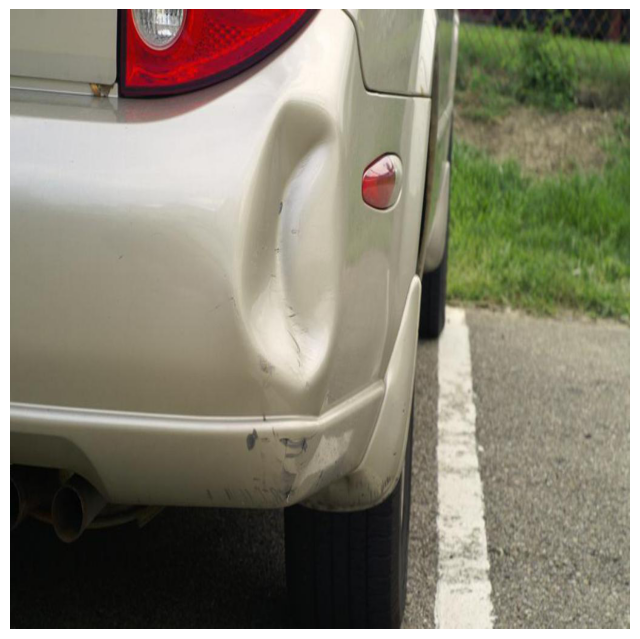

In [ ]:
IMG = io.imread(img_dir + '/' + img['file_name'])
plt.axis('off')
plt.imshow(IMG)
plt.show()

In [ ]:
#get damage annotations
annot_ids = coco.getAnnIds(imgIds=imgId,iscrowd=None)
annots = coco.loadAnns(annot_ids)

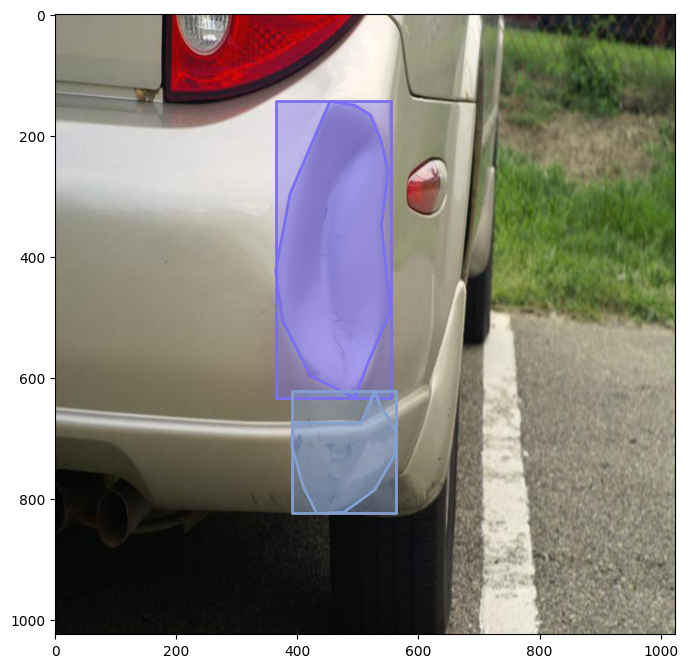

In [ ]:
#Plot damages
plt.imshow(IMG)
plt.axis('on')
coco.showAnns(annots, draw_bbox=True )

In [ ]:
#get parts annotations
mul_annot_ids = mul_coco.getAnnIds(imgIds=imgId,iscrowd=None)
mul_annots = mul_coco.loadAnns(mul_annot_ids)

In [ ]:
# Create a dictionary between category_id and category name
category_map = dict()

category_map = {ele['id']: ele['name'] for ele in mul_coco.cats.values()}

In [ ]:
category_map

{1: 'headlamp', 2: 'rear_bumper', 3: 'door', 4: 'hood', 5: 'front_bumper'}

Parts are: ['headlamp', 'rear_bumper']


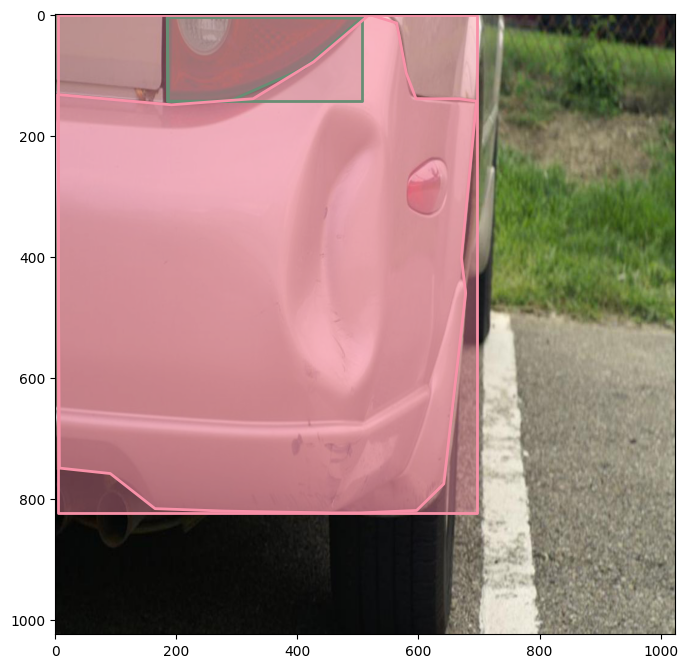

In [ ]:
#Create a list of parts in the image
parts = []
for region in mul_annots:
    parts.append(category_map[region['category_id']])

print("Parts are:", parts) 

#Plot Parts
IMG = io.imread(img_dir + '/' + img['file_name'])
plt.imshow(IMG)
plt.axis('on')
mul_coco.showAnns(mul_annots, draw_bbox=True )

# Installing Detectron and Pytorch

In [7]:
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
import torch, torchvision
torch.__version__

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-kawtctaa
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-kawtctaa
  Resolved https://github.com/facebookresearch/fvcore.git to commit 51092b5515cbb493f73de079743dd6b11cc4bbf1
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fvcore: filename=fvcore-0.1.6-py3-none-any.whl size=65405 sha256=544d739f9beea40cb289388637e278dc386ee1634b30010154e9329dddff12e8
  Stored in directory: /tmp/pip-ephem-wheel-cache-t6fup2yb/wheels/8f/cb/6a/3b7ac0e01781855ca3d1417ebf9e15e20d5b7fe37ab063aa50
  Created wheel for iopath: filename=

'2.0.0+cu118'

In [8]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 15038, done.
remote: Counting objects: 100% (63/63), done.
remote: Compressing objects: 100% (31/31), done.
remote: Total 15038 (delta 33), reused 51 (delta 32), pack-reused 14975
Receiving objects: 100% (15038/15038), 6.11 MiB | 22.11 MiB/s, done.
Resolving deltas: 100% (10896/10896), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/detectron2_repo
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

# Import Libraries required for training

In [1]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

2.0.0+cu118 False


In [2]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
import matplotlib.pyplot as plt
import skimage.io as io

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer
from detectron2.utils.visualizer import ColorMode
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Set base params
plt.rcParams["figure.figsize"] = [16,9]

In [3]:
!python -m detectron2.utils.collect_env

No CUDA runtime is found, using CUDA_HOME='/usr/local/cuda'
-------------------------------  -----------------------------------------------------------------
sys.platform                     linux
Python                           3.10.11 (main, Apr  5 2023, 14:15:10) [GCC 9.4.0]
numpy                            1.22.4
detectron2                       0.6 @/content/detectron2_repo/detectron2
Compiler                         GCC 9.4
CUDA compiler                    not available
DETECTRON2_ENV_MODULE            <not set>
PyTorch                          2.0.0+cu118 @/usr/local/lib/python3.10/dist-packages/torch
PyTorch debug build              False
torch._C._GLIBCXX_USE_CXX11_ABI  False
GPU available                    No: torch.cuda.is_available() == False
Pillow                           8.4.0
torchvision                      0.15.1+cu118 @/usr/local/lib/python3.10/dist-packages/torchvision
fvcore                           0.1.5.post20221221
iopath                           0.1.9
cv2

# Register Dataset with COCO

In [7]:
dataset_path = "/content/datasets"
img_path = "img/"
train_path = "train/"
val_path = "val/"
test_path = "/content/datasets2/test"

In [8]:
DatasetCatalog.clear()
MetadataCatalog.clear()

In [9]:
# register the dataset and parts annotation
from detectron2.data.datasets import register_coco_instances

# parts annotation
register_coco_instances("car_dataset_train", {}, os.path.join(dataset_path,train_path,"COCO_mul_train_annos.json"), os.path.join(dataset_path,img_path))
register_coco_instances("car_dataset_val", {}, os.path.join(dataset_path,val_path,"COCO_mul_val_annos.json"), os.path.join(dataset_path,img_path))
register_coco_instances("car_dataset_test", {}, os.path.join(test_path,"_annotations.coco.json"), os.path.join("/content/datasets2",img_path))

In [10]:
dataset_dicts = DatasetCatalog.get("car_dataset_train")
metadata_dicts = MetadataCatalog.get("car_dataset_train")

[05/07 14:37:14 d2.data.datasets.coco]: Loaded 59 images in COCO format from /content/datasets/train/COCO_mul_train_annos.json


# Train Model

In [ ]:
class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
from detectron2.data.transforms import RandomFlip, RandomCrop, ResizeShortestEdge


cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("car_dataset_train",)
cfg.DATASETS.TEST = ("car_dataset_val",)
cfg.DATALOADER.NUM_WORKERS = 4

# Added augmentations to increase accuracy
augmentations = [
    RandomFlip(prob=0.5, horizontal=True, vertical=False),
    RandomCrop("relative", (0.9, 0.9)),
    ResizeShortestEdge(short_edge_length=(800, 1000), max_size=1333),
]
# Set the augmentation options in the data loader
cfg.INPUT.AUGMENTATIONS = augmentations

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml") # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001 
cfg.SOLVER.WARMUP_ITERS = 800
cfg.SOLVER.MAX_ITER = 1600 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (600, 1550)
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5
cfg.MODEL.RETINANET.NUM_CLASSES = 5
cfg.TEST.EVAL_PERIOD = 600


!rm -rf cfg.OUTPUT_DIR


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[05/02 16:03:20 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_f10217.pkl: 178MB [00:00, 211MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[05/02 16:03:21 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/02 16:03:45 d2.utils.events]:  eta: 0:18:46  iter: 19  total_loss: 3.251  loss_cls: 1.707  loss_box_reg: 0.6951  loss_mask: 0.6927  loss_rpn_cls: 0.1156  loss_rpn_loc: 0.02503    time: 0.7021  last_time: 0.7633  data_time: 0.0436  last_data_time: 0.0377   lr: 2.1638e-06  max_mem: 3095M
[05/02 16:04:05 d2.utils.events]:  eta: 0:18:38  iter: 39  total_loss: 3.201  loss_cls: 1.656  loss_box_reg: 0.6754  loss_mask: 0.6925  loss_rpn_cls: 0.1013  loss_rpn_loc: 0.02333    time: 0.7699  last_time: 0.7390  data_time: 0.0296  last_data_time: 0.0422   lr: 3.3888e-06  max_mem: 3095M
[05/02 16:04:21 d2.utils.events]:  eta: 0:18:36  iter: 59  total_loss: 3.161  loss_cls: 1.588  loss_box_reg: 0.7665  loss_mask: 0.6917  loss_rpn_cls: 0.0961  loss_rpn_loc: 0.02522    time: 0.7727  last_time: 0.6785  data_time: 0.0387  last_data_time: 0.0206   lr: 4.6137e-06  max_mem: 3095M
[05/02 16:04:34 d2.utils.events]:  eta: 0:18:04  iter: 79  total_loss: 3.025  loss_cls: 1.499  loss_box_reg: 0.6943  loss_mask:

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/02 16:10:46 d2.evaluation.evaluator]: Inference done 11/11. Dataloading: 0.0010 s/iter. Inference: 0.1191 s/iter. Eval: 0.2983 s/iter. Total: 0.4184 s/iter. ETA=0:00:00
[05/02 16:10:46 d2.evaluation.evaluator]: Total inference time: 0:00:02.636870 (0.439478 s / iter per device, on 1 devices)
[05/02 16:10:46 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.119063 s / iter per device, on 1 devices)
[05/02 16:10:46 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/02 16:10:46 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/02 16:10:46 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/02 16:10:46 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/02 16:10:46 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[05/02 16:10:46 d2.evaluation

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/02 16:18:00 d2.evaluation.evaluator]: Inference done 11/11. Dataloading: 0.0010 s/iter. Inference: 0.0968 s/iter. Eval: 0.1841 s/iter. Total: 0.2819 s/iter. ETA=0:00:00
[05/02 16:18:00 d2.evaluation.evaluator]: Total inference time: 0:00:01.823761 (0.303960 s / iter per device, on 1 devices)
[05/02 16:18:00 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.096805 s / iter per device, on 1 devices)
[05/02 16:18:00 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/02 16:18:00 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/02 16:18:00 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/02 16:18:00 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/02 16:18:00 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[05/02 16:18:00 d2.evaluation

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/02 16:22:49 d2.evaluation.evaluator]: Inference done 11/11. Dataloading: 0.0010 s/iter. Inference: 0.0889 s/iter. Eval: 0.0919 s/iter. Total: 0.1818 s/iter. ETA=0:00:00
[05/02 16:22:49 d2.evaluation.evaluator]: Total inference time: 0:00:01.224247 (0.204041 s / iter per device, on 1 devices)
[05/02 16:22:49 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.088948 s / iter per device, on 1 devices)
[05/02 16:22:49 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/02 16:22:49 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/02 16:22:49 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/02 16:22:49 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/02 16:22:49 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[05/02 16:22:49 d2.evaluation

In [ ]:
# Look at training curves in tensorboard:
%reload_ext tensorboard
%tensorboard --logdir ./output

Output hidden; open in https://colab.research.google.com to view.

# Model Evaluation

In [ ]:
evaluator = COCOEvaluator("car_dataset_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "car_dataset_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

WARNING [05/02 16:22:55 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/02 16:22:55 d2.data.datasets.coco]: Loaded 11 images in COCO format from /content/datasets/val/COCO_mul_val_annos.json
[05/02 16:22:55 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/02 16:22:55 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/02 16:22:55 d2.data.common]: Serializing 11 elements to byte tensors and concatenating them all ...
[05/02 16:22:55 d2.data.common]: Serialized dataset takes 0.01 MiB
[05/02 16:22:55 d2.evaluation.evaluator]: Start inference on 11 batches


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/02 16:22:58 d2.evaluation.evaluator]: Inference done 11/11. Dataloading: 0.0010 s/iter. Inference: 0.0869 s/iter. Eval: 0.0911 s/iter. Total: 0.1789 s/iter. ETA=0:00:00
[05/02 16:22:58 d2.evaluation.evaluator]: Total inference time: 0:00:01.217789 (0.202965 s / iter per device, on 1 devices)
[05/02 16:22:58 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.086901 s / iter per device, on 1 devices)
[05/02 16:22:58 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/02 16:22:58 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[05/02 16:22:58 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/02 16:22:58 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/02 16:22:58 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[05/02 16:22:58 d2.evaluation.

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold for this model
cfg.DATASETS.TEST = ("car_dataset_val", )
predictor = DefaultPredictor(cfg)

[05/02 16:22:59 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [15]:
val_dataset_dicts = DatasetCatalog.get("car_dataset_val")
val_metadata_dicts = MetadataCatalog.get("car_dataset_val")

[05/07 14:41:13 d2.data.datasets.coco]: Loaded 11 images in COCO format from /content/datasets/val/COCO_mul_val_annos.json


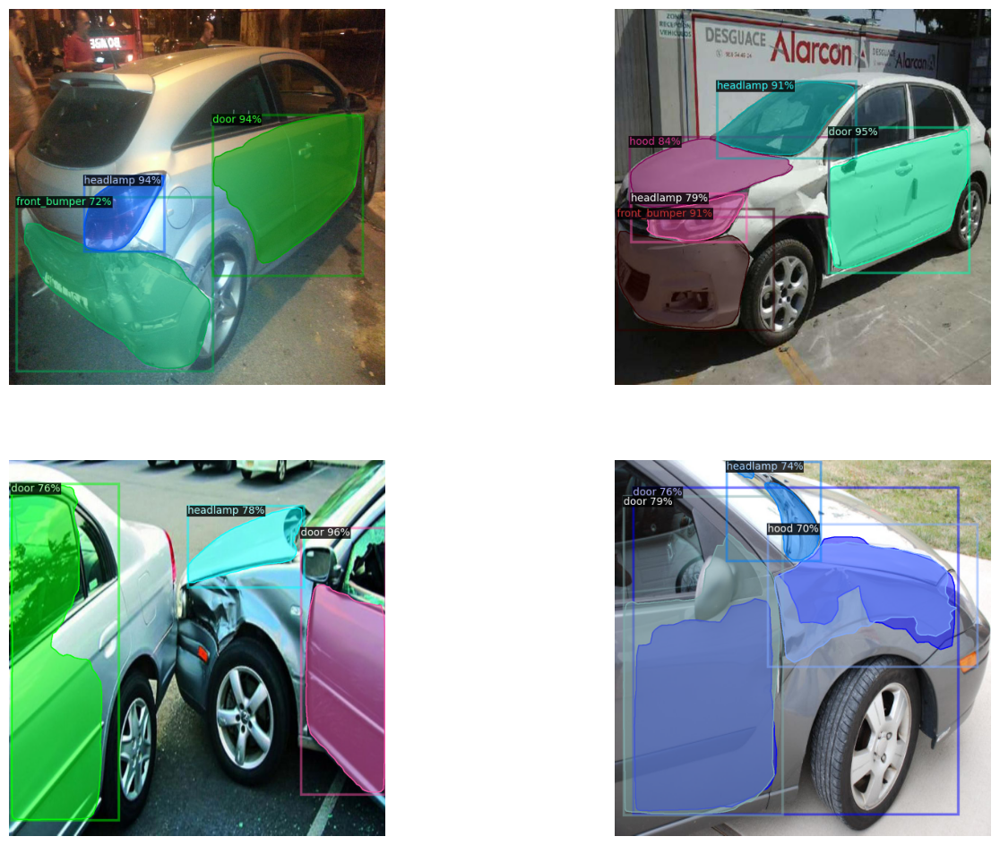

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(16, 12))
indices = ax.flatten()
for i, d in enumerate(random.sample(val_dataset_dicts, 4)):
    im = io.imread(d["file_name"])
    outputs = predictor(im)
    out = Visualizer(im[:, :, ::-1],
                     metadata=val_metadata_dicts, 
                     scale=0.5, 
                     instance_mode=ColorMode.IMAGE
           ).draw_instance_predictions(outputs["instances"].to("cpu"))
    indices[i].imshow(out.get_image()[:, :, ::-1])
    indices[i].axis('off')


## Test using precomputed Model

In [11]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5  # only has one class (damage) + 1
cfg.MODEL.RETINANET.NUM_CLASSES = 5 # only has one class (damage) + 1
cfg['MODEL']['DEVICE']='cpu'#or cuda
cfg.MODEL.WEIGHTS = os.path.join("/content/drive/MyDrive/models/part_segmentation_model.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold for this model
predictor = DefaultPredictor(cfg)

[05/07 14:40:00 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/models/part_segmentation_model.pth ...


In [17]:
test_dataset_dicts = DatasetCatalog.get("car_dataset_test")
test_metadata_dicts = MetadataCatalog.get("car_dataset_test")

WARNING [05/07 14:42:02 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/07 14:42:02 d2.data.datasets.coco]: Loaded 486 images in COCO format from /content/datasets2/test/_annotations.coco.json


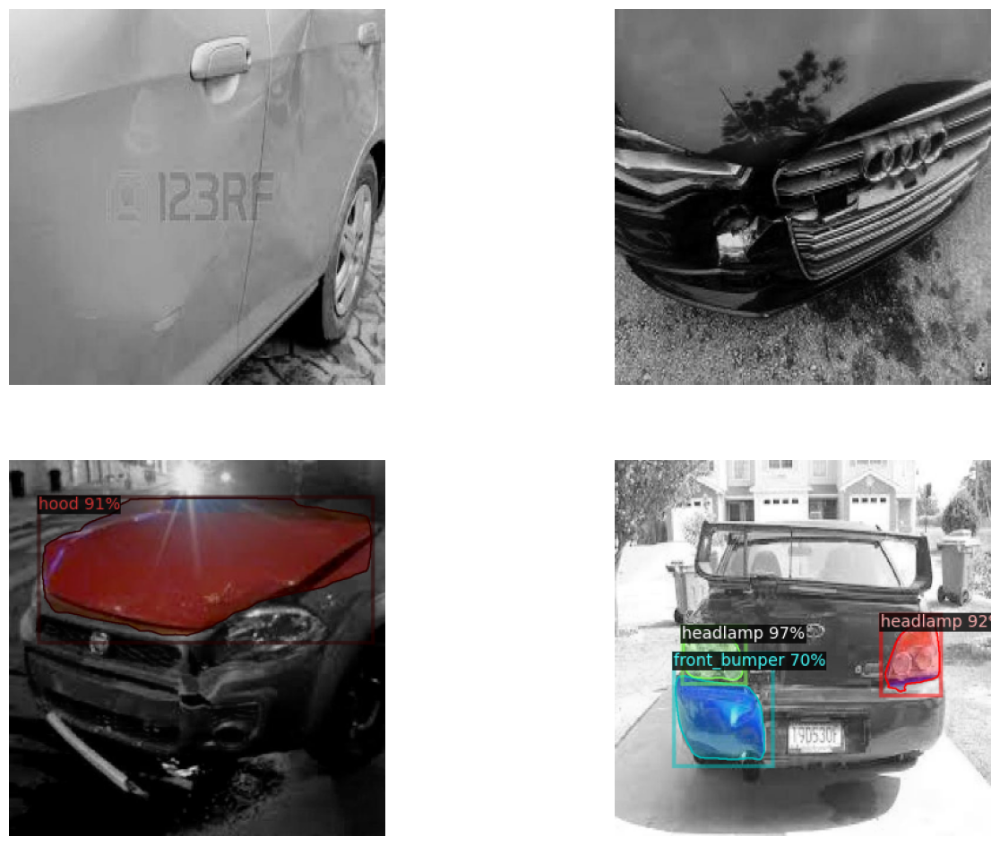

In [21]:
fig, ax = plt.subplots(2, 2, figsize=(16, 12))
indices = ax.flatten()
for i, d in enumerate(random.sample(test_dataset_dicts, 4)):
    im = io.imread(d["file_name"])
    outputs = predictor(im)
    out = Visualizer(im[:, :, ::-1],
                     metadata=val_metadata_dicts, 
                     scale=0.5, 
                     instance_mode=ColorMode.IMAGE_BW
           ).draw_instance_predictions(outputs["instances"].to("cpu"))
    indices[i].imshow(out.get_image()[:, :, ::-1])
    indices[i].axis('off')


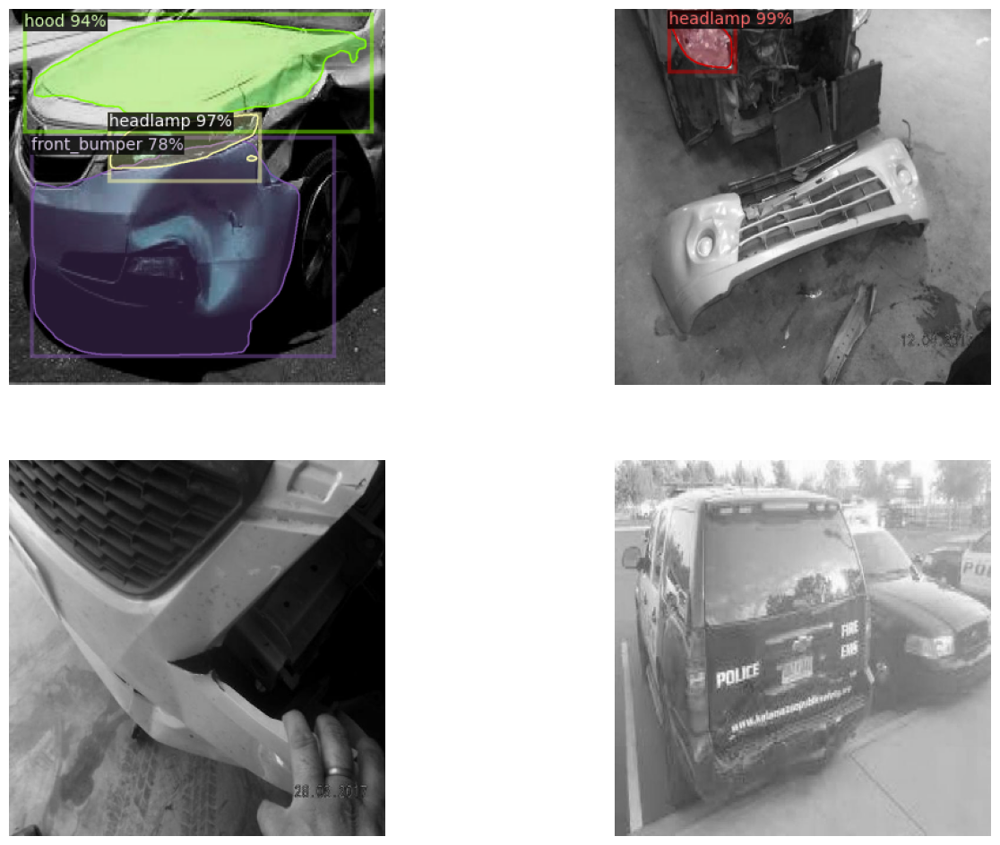

In [22]:
fig, ax = plt.subplots(2, 2, figsize=(16, 12))
indices = ax.flatten()
for i, d in enumerate(random.sample(test_dataset_dicts, 4)):
    im = io.imread(d["file_name"])
    outputs = predictor(im)
    out = Visualizer(im[:, :, ::-1],
                     metadata=val_metadata_dicts, 
                     scale=0.5, 
                     instance_mode=ColorMode.IMAGE_BW
           ).draw_instance_predictions(outputs["instances"].to("cpu"))
    indices[i].imshow(out.get_image()[:, :, ::-1])
    indices[i].axis('off')


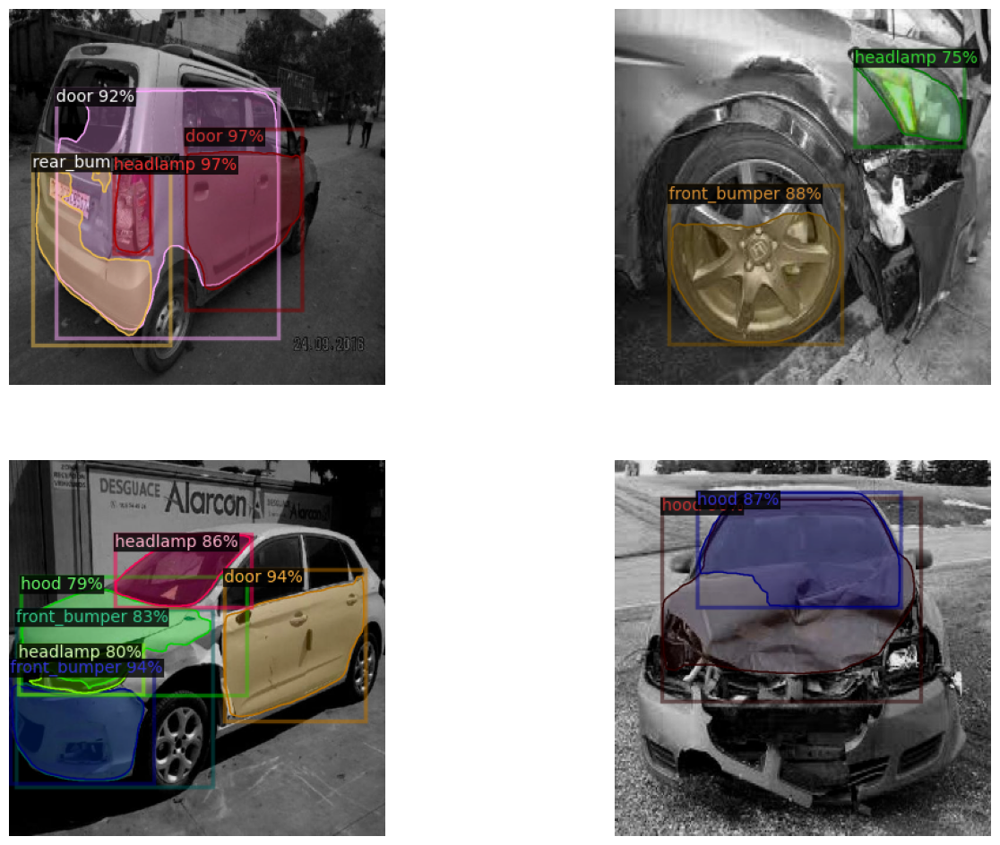

In [19]:
fig, ax = plt.subplots(2, 2, figsize=(16, 12))
indices = ax.flatten()
for i, d in enumerate(random.sample(test_dataset_dicts, 4)):
    im = io.imread(d["file_name"])
    outputs = predictor(im)
    out = Visualizer(im[:, :, ::-1],
                     metadata=val_metadata_dicts, 
                     scale=0.5, 
                     instance_mode=ColorMode.IMAGE_BW
           ).draw_instance_predictions(outputs["instances"].to("cpu"))
    indices[i].imshow(out.get_image()[:, :, ::-1])
    indices[i].axis('off')


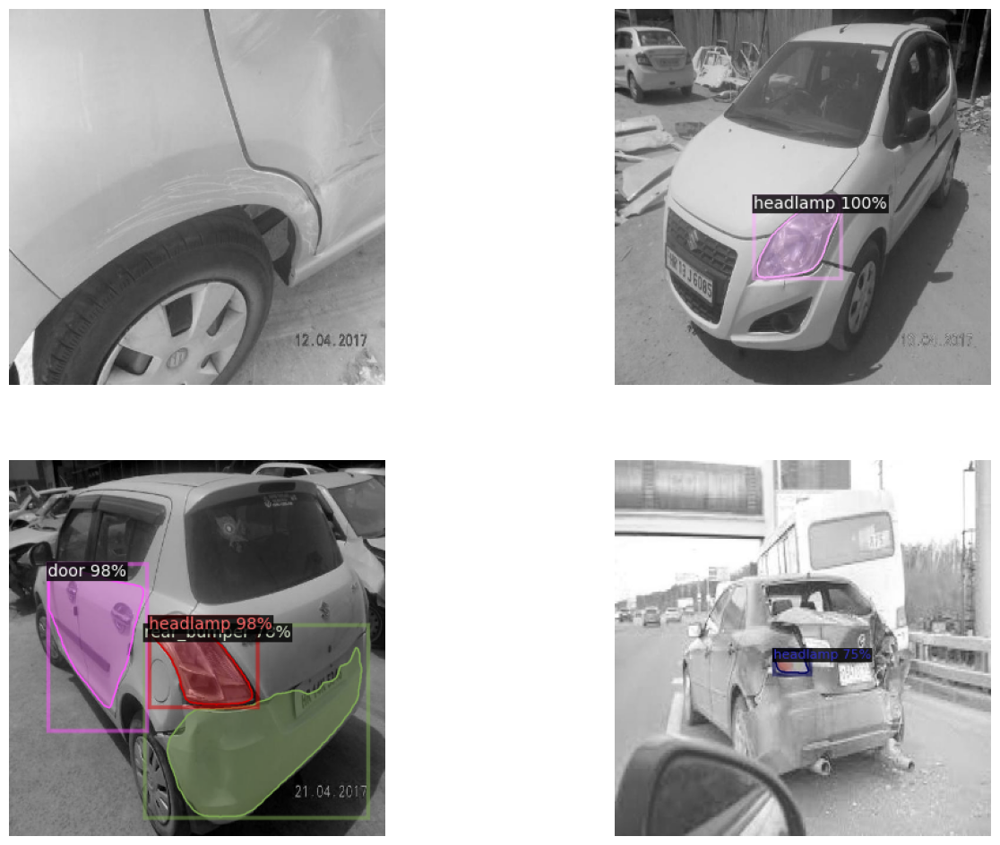

In [20]:
fig, ax = plt.subplots(2, 2, figsize=(16, 12))
indices = ax.flatten()
for i, d in enumerate(random.sample(test_dataset_dicts, 4)):
    im = io.imread(d["file_name"])
    outputs = predictor(im)
    out = Visualizer(im[:, :, ::-1],
                     metadata=val_metadata_dicts, 
                     scale=0.5, 
                     instance_mode=ColorMode.IMAGE_BW
           ).draw_instance_predictions(outputs["instances"].to("cpu"))
    indices[i].imshow(out.get_image()[:, :, ::-1])
    indices[i].axis('off')


# Saving Model and Other

In [ ]:
!mkdir models
!cp /content/output/model_final.pth /content/models/part_segmentation_model.pth

In [ ]:
# !cp models /content/drive/MyDrive -r

In [ ]:
# If you get this "NotImplementedError: A UTF-8 locale is required. Got ANSI_X3.4-1968" error run below command
import locale
locale.getpreferredencoding = lambda: "UTF-8"

Instances(num_instances=5, image_height=1024, image_width=1024, fields=[pred_boxes: Boxes(tensor([[523.1179, 556.0092, 705.1560, 661.7113],
        [395.2044, 328.2442, 937.0082, 579.9990],
        [452.2703, 577.6242, 938.6981, 886.8059],
        [531.8149, 554.1904, 625.1676, 645.3311],
        [158.9169, 232.8820, 364.9676, 692.8572]])), scores: tensor([0.9461, 0.8461, 0.8210, 0.7888, 0.7023]), pred_classes: tensor([0, 3, 4, 0, 2]), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
 

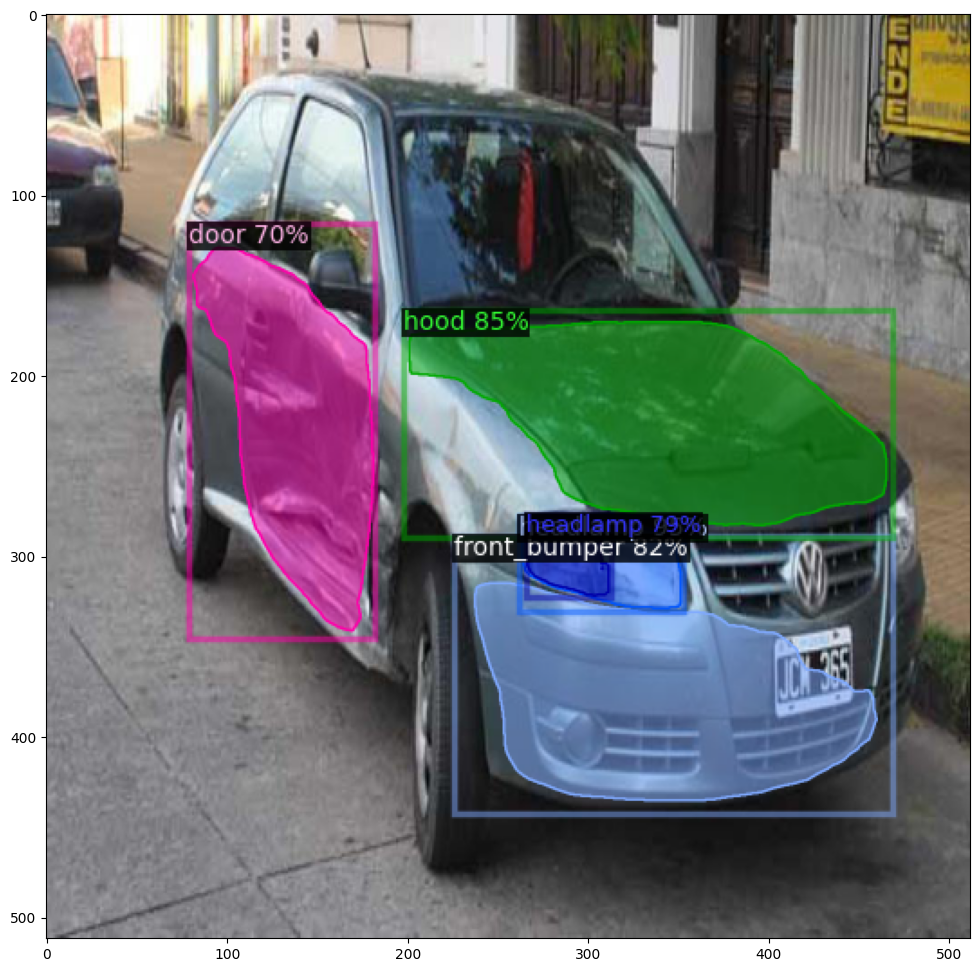

In [ ]:
# Run model on custom image. Replace path in io.imread()
fig, ax = plt.subplots(1, 1, figsize =(16,12))
indices=[ax]

im = io.imread("/content/datasets/test/28.jpg")
outputs = predictor(im)
print(outputs["instances"].to("cpu"))
v = Visualizer(im[:, :, ::-1],
                metadata=val_metadata_dicts, 
                scale=0.5, 
                instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels. This option is only available for segmentation models
)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
indices[0].grid(False)
indices[0].imshow(out.get_image()[:, :, ::-1])